In [72]:
%pylab inline
import pandas as pd
from sklearn import decomposition
import librosa
from scipy.signal import resample
from  librosa.util import frame
import scipy
import IPython
from IPython.display import display, Audio
from sklearn.cluster import KMeans,DBSCAN, estimate_bandwidth, MeanShift

%run ../utils.py

rc_default()

Populating the interactive namespace from numpy and matplotlib


/usr/local/lib/python3.4/dist-packages/IPython/core/magics/pylab.py:161: UserWarning: pylab import has clobbered these variables: ['rec']
`%matplotlib` prevents importing * from pylab and numpy
  "\n`%matplotlib` prevents importing * from pylab and numpy"


In [73]:
path = "../wavs/"
fnames = ["Grisey_partiels.wav"]
T1 = 0
T2 = 120
# fnames = ["Stockhausen_Kontakte.wav"]
# T1 = 0
# T2 = None
# fnames = ["BeachBoys_SurfinUSA.wav"]
# T1 = 0
# T2 = None

NFFT = 2**11
HOP = int(NFFT/4)
WIN_LENGTH = NFFT
sr = 44100

In [74]:
orig_sr, track  = wav2audio_segment(path+fnames[0],T1,T2)

# Read wav file to floating values
# sr = 16000
# signal = resample(signal, int(signal.size*sr/orig_sr)).astype(np.float64,order='C')

/usr/local/lib/python3.4/dist-packages/scipy/io/wavfile.py:267: WavFileWarning: Chunk (non-data) not understood, skipping it.
  WavFileWarning)


In [75]:
S = librosa.stft(track,n_fft=NFFT, hop_length=HOP,center=False)

/usr/local/lib/python3.4/dist-packages/ipykernel/__main__.py:2: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  from ipykernel import kernelapp as app


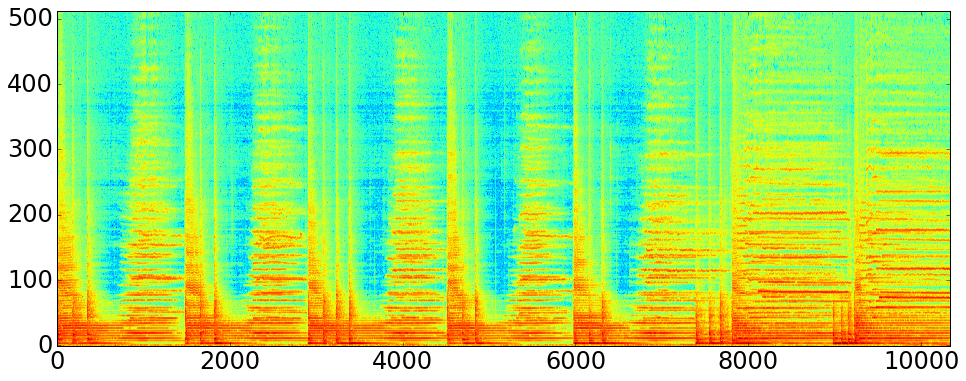

In [76]:
figure(figsize=(16,6))
imshow(log10((abs(S[:NFFT/4,:]))),aspect='auto',origin='bottom');

In [128]:
frames_length= 64
idx = frame(arange(S.shape[1]),frame_length=frames_length, hop_length=int(frames_length/2))
Sframes = abs(S)[:NFFT/4,idx]
Sframes = np.rollaxis(Sframes,2)
print(Sframes.shape)
window = hanning(frames_length)
Sframes = Sframes*window

MPS = []

for Sf in Sframes:
    x = Sf
    y = fftshift(abs(fft.fft2(x))**2)
    y = y/y.sum()
    MPS.append(y)

MPS = np.array(MPS)


/usr/local/lib/python3.4/dist-packages/ipykernel/__main__.py:3: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  app.launch_new_instance()


(321, 512, 64)


/usr/local/lib/python3.4/dist-packages/ipykernel/__main__.py:6: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


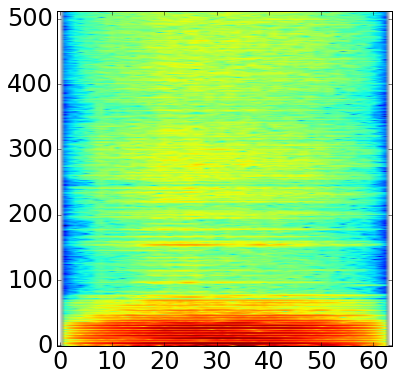

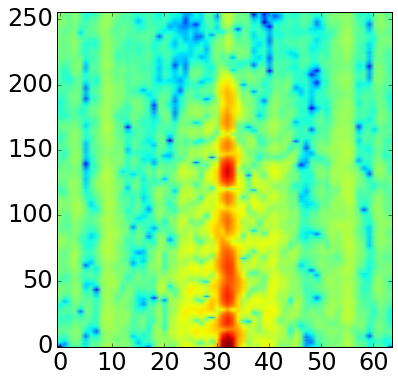

In [129]:
k = 20
figure(figsize=(6,6))
imshow(log10(Sframes[k]),aspect='auto',origin='bottom')
figure(figsize=(6,6))
# MPS[k].flat[np.argmin(MPS[k])]=np.nan
X = MPS[k][NFFT/8:,:]
# X = X-MPS[:,NFFT/8:,:].mean(0)
imshow(log10(X),aspect='auto',origin='bottom')

In [130]:
figure(figsize=(20,10))
imshow(montage(log10(MPS[:,:NFFT/8,:])),aspect='auto');
axis('off')
savefig('../charla demo/figs/montage_MPS_partiels.png')
plt.close()

/usr/local/lib/python3.4/dist-packages/ipykernel/__main__.py:2: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  from ipykernel import kernelapp as app


In [131]:
frames_length*NFFT/sr

2.972154195011338

In [132]:
ndata = Sframes.shape[0]
X = MPS[:,int(NFFT/8):,:].reshape(ndata,-1)
# Xnorm = normalize(X)
idx = argsort(X.sum(0))[::-1]
Xnorm = ((X-X.mean(0)) / X.std(0))
Xsort = X[:,idx]

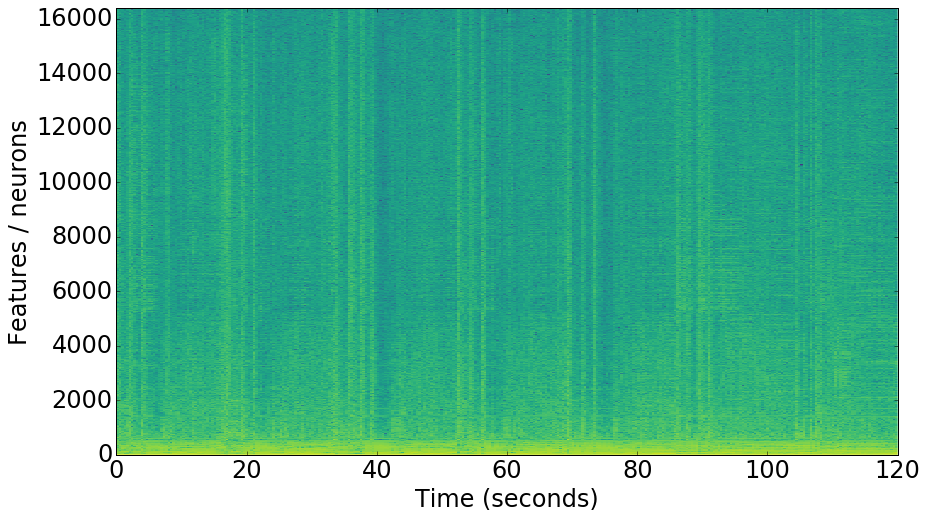

In [135]:
figure(figsize=(14,8))
duration = track.size/sr
imshow(log10(Xsort.T),aspect='auto',origin='bottom',cmap=cm.viridis,interpolation='none',extent=[0,duration,0,X.shape[1]]);
xlabel('Time (seconds)')
ylabel('Features / neurons');
savefig('../charla demo/figs/MPS_features_partiels.png')

In [134]:
from sklearn.decomposition import TruncatedSVD
svd = TruncatedSVD(n_components=20, n_iter=7, random_state=42)
svd.fit(Xnorm) 
print(svd.explained_variance_ratio_) 
print(svd.explained_variance_ratio_.sum()) 

[ 0.30188943  0.0543478   0.03774737  0.02970616  0.0245131   0.02341472
  0.02146782  0.02060707  0.01859761  0.01798678  0.01555753  0.01494087
  0.01304947  0.01274829  0.01258048  0.01217758  0.01104     0.01051527
  0.01022961  0.0094408 ]
0.672557731378


In [82]:
from  sklearn.decomposition import PCA
pca = PCA(n_components=80)
Xpca = pca.fit_transform( Xnorm )
# plot(cumsum(pca.explained_variance_ratio_),'.-')
print(pca.explained_variance_ratio_.sum()) 

0.948012267684


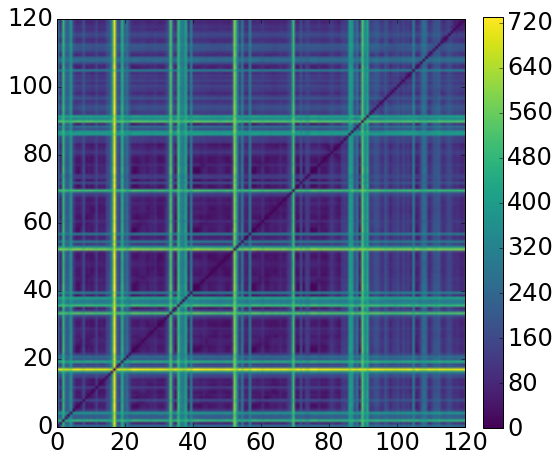

In [60]:
duration = track.size/sr
# rec = librosa.segment.recurrence_matrix(abs(S[:int(NFFT/4),:]),k=1120,metric='euclidean',sym=True,mode='distance')
# figure(figsize=(8,8))
# im = imshow(rec, extent=[0,duration,0,duration]);
rec = librosa.segment.recurrence_matrix(Xpca.T,k=1120,metric='euclidean',sym=True,mode='distance')
figure(figsize=(8,8))
im = imshow(rec, extent=[0,duration,0,duration],cmap=cm.viridis,vmin=np.nanmin(rec),vmax=np.nanmax(rec),origin='bottom');
colorbar(im,fraction=0.046, pad=0.04)

/usr/local/lib/python3.4/dist-packages/IPython/lib/display.py:135: RuntimeWarning: invalid value encountered in true_divide
  scaled = np.int16(data/np.max(np.abs(data))*32767).tolist()


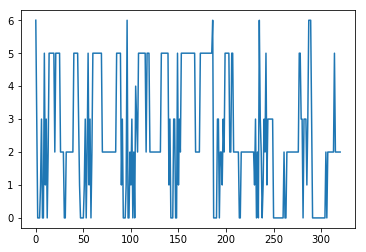

In [86]:
WIN_LENGTH2=frames_length*HOP
HOP2=int(frames_length*HOP/2)

frames = frame(track, frame_length=WIN_LENGTH2, hop_length=HOP2)
t = linspace(0,HOP/float(sr)*frames.shape[1],frames.shape[1])
normframes = frames/sqrt((frames**2).mean(0))

X = Xpca1
n_clusters=7
labels = KMeans(n_clusters=n_clusters, random_state=170).fit_predict(X)
plot(labels)
for i in range(n_clusters):
    outsignal = framesoverlap(frames[:,labels==i],HOP2, WIN_LENGTH2 )
    display(Audio(data=outsignal,rate=sr))

In [23]:
128*HOP

8388608

/usr/local/lib/python3.4/dist-packages/ipykernel/__main__.py:28: RuntimeWarning: invalid value encountered in log10


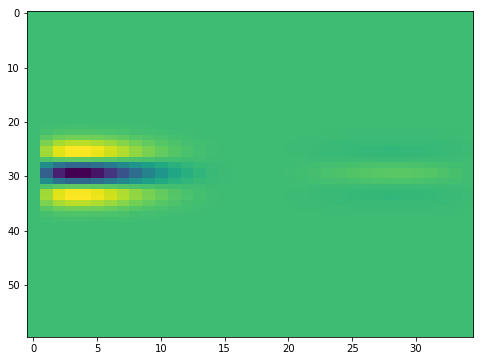

/usr/local/lib/python3.4/dist-packages/matplotlib/image.py:373: RuntimeWarning: invalid value encountered in less
  rgba[..., 1] = A < 0  # under data
/usr/local/lib/python3.4/dist-packages/matplotlib/image.py:374: RuntimeWarning: invalid value encountered in greater
  rgba[..., 2] = A > 1  # over data


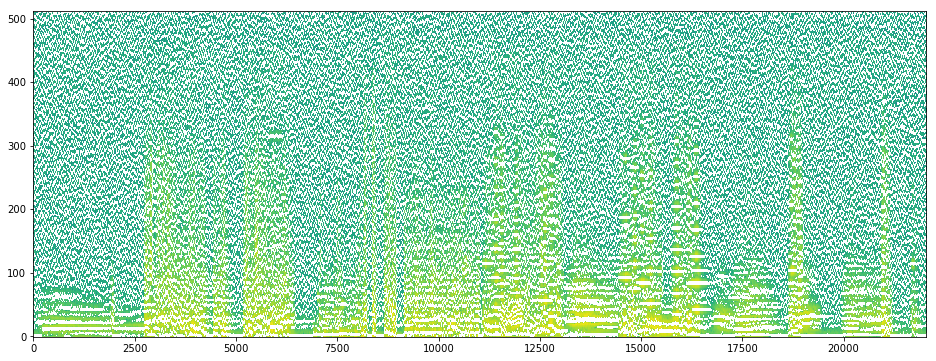

In [12]:
from scipy import signal
from scipy.signal import fftconvolve
N = 120

hs = lambda x:(1 - x**2)*exp(-x**2/2)
ht = lambda t: t**2*exp(-3.5*t)*sin(2*pi*t)

s=0.01
w = 5
sr2 = sr/HOP
T = 0.2
t = arange(T*sr2)/sr2
t = t-T/2

df= sr/NFFT
x = arange(60)*df
x=x-x.mean()

kernel = np.outer(s*hs(s*x), w*ht(w*t))

Y = fftconvolve(abs(S),kernel,mode='same')
figure(figsize=(8,6))
imshow(kernel,aspect='auto')

figure(figsize=(16,6))


imshow(log10(Y),aspect='auto',origin='bottom')

In [13]:
HOP

256